In [1]:
%matplotlib inline

In [2]:
import itertools
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne
import mne_bids
import librosa as lbr

In [3]:
ROOT = Path("../data/MASC-MEG")

In [4]:
phoneme_info = pd.read_csv(ROOT / "phoneme_info.csv")
phoneme_list = phoneme_info.phoneme.tolist()

In [5]:
class Parameters(dict):
    def __getattr__(self, attr):
        try:
            if isinstance(self[attr], dict):
                return Parameters(**self[attr])
            return self[attr]
        except KeyError:
            raise AttributeError(attr)

    def __getitem__(self, item):
        if item in self:
            if isinstance(self.get(item), dict):
                return Parameters(**self.get(item))
            return self.get(item)
        else:
            raise KeyError(item)

    def __repr__(self):
        return "Parameters " + super(Parameters, self).__repr__()

    def __str__(self):
        return "Parameters " + super(Parameters, self).__str__()

In [6]:
P = Parameters(
    bandpass=dict(high=30.0, low=0.5),
    scaler="RobustScaler",
    quantile_range=(25.0, 75.0),
    seed=42,
    epochs=dict(decim=4, tmin=-0.2, tmax=0.6, baseline=(-0.2, 0.0)),
    raw_sfreq=1000,
)

In [7]:
import pickle

EPOCHS_ID = "250Hz-800ms-sub12"

EPOCHS_ROOT = Path("../data/formatted/ph_epochs/")

with open(EPOCHS_ROOT / f"info-{EPOCHS_ID}.pkl", "rb+") as fp:
    info = pickle.load(fp)
    
data = np.load(EPOCHS_ROOT / f"epochs-{EPOCHS_ID}.npy")

meta = pd.read_csv(EPOCHS_ROOT / f"meta-{EPOCHS_ID}.csv")

In [8]:
ph_epochs = mne.EpochsArray(data, info, metadata=meta)

Adding metadata with 26 columns
30761 matching events found
No baseline correction applied
0 projection items activated


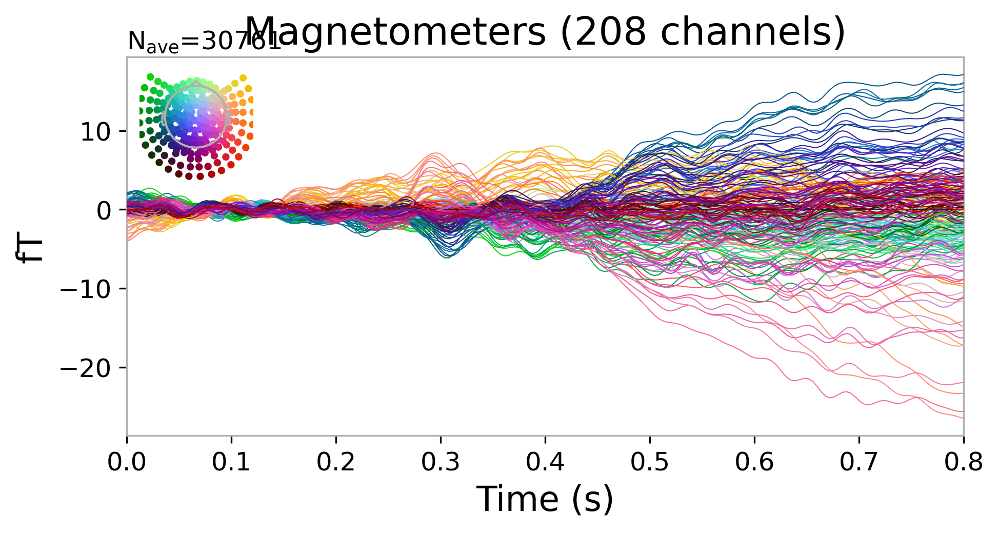

In [9]:
ph_epochs.average().plot()
plt.show()

<AxesSubplot: xlabel='s_phoneme'>

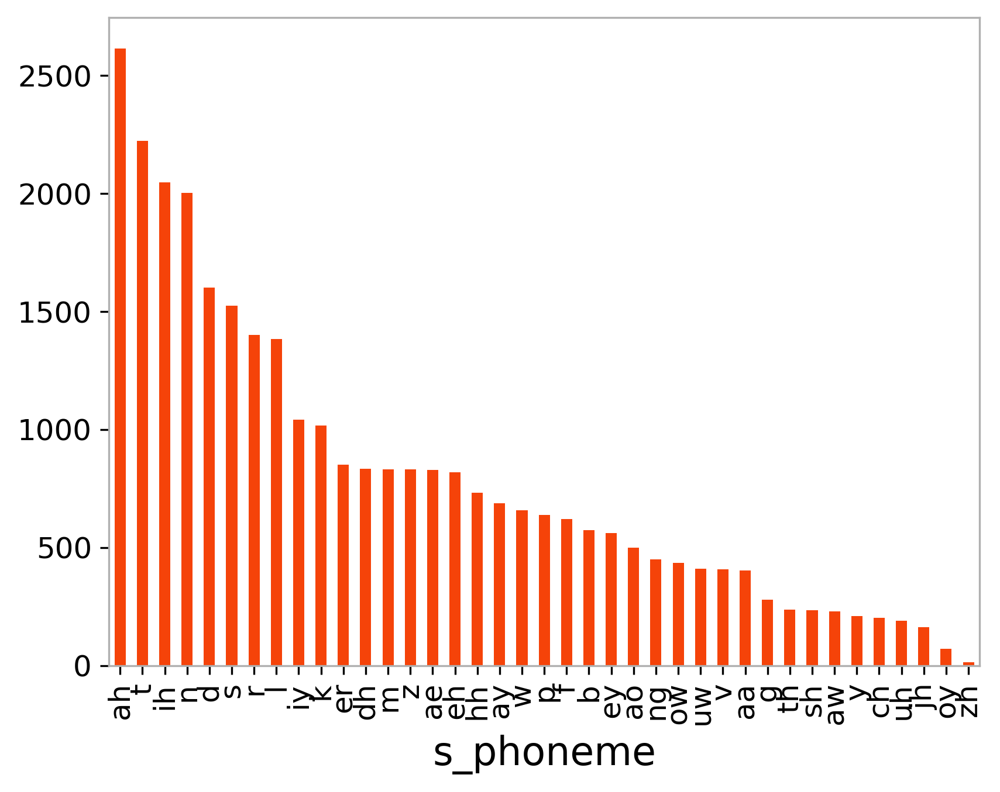

In [10]:
meta.query("kind=='phoneme'").groupby("s_phoneme")[
    "s_phoneme"
].count().sort_values(ascending=False).plot.bar()

In [11]:
P.epoch_length = data.shape[-1]

---
Execute only if you need to recreate audio data

In [31]:
# start column in metadata is the phoneme/word onset 
# in the sound (one of the 4 audio bouts)
from functools import partial

import librosa as lbr

from tqdm import tqdm

P.sound_sfreq = 22050

# Params from Gwilliams, King, Poeppel "Neural dynamics of phoneme sequences reveal position-invariant code for content and order"
# epoch_duration = P.epochs.tmax - P.epochs.tmin
P.hop_length = 128 # round(epoch_duration * P.sound_sfreq) // P.epoch_length
P.n_fft = 2048
P.n_mels = 208
P.window = "hamming"

meta = ph_epochs.metadata
meta["l_story"] = meta.story.str.lower()
meta.sound_id = meta.sound_id.astype(int)


def segment_audio(meta_row, x, sfreq, audio_list):
    onset = meta_row.start
    start = round((onset - np.abs(P.epochs.tmin)) * sfreq)
    end = start + P.epoch_length
    
    assert end - start == P.epoch_length, f"{end - start} != {P.epoch_length}"
    
    if start < 0:
        # 0-pad
        x_ = x[0:end]
        y = np.pad(x_, ((-start, 0), (0, 0)), constant_values=(0, 0))
    elif end > x.shape[0]:
        x_ = x[start:]
        y = np.pad(x_, ((0, end-x.shape[0]), (0, 0)), constant_values=(0, 0))
    else:
        y = x[start:end]
    
    # meta_row.name is the epoch index
    # should not mix anything
    audio_list[meta_row.name] = y

audio_files = ROOT / "stimuli" / "audio"
audios = [None] * len(ph_epochs)
for file in tqdm(list(audio_files.glob("*.wav"))):
    f = file.stem
    story = "_".join(f.split("_")[:-1])
    if len(story) < 1:
        print("Wrong filename format:", file)
        continue
    
    sound_id = int(f.split("_")[-1])
    meta_story = meta[meta.l_story.str.contains(story.lower())]
    meta_sound = meta_story.query("sound_id==@sound_id")
    
    sfreq = None
    y, sfreq = lbr.load(file, sr=sfreq)
    mel = lbr.feature.melspectrogram(
        y=y, 
        sr=sfreq, 
        n_fft=P.n_fft,
        hop_length=P.hop_length,
        window=P.window,
        n_mels=P.n_mels,
    )
    
    mel = lbr.resample(
        mel, 
        orig_sr=P.sound_sfreq // P.hop_length, 
        target_sr=P.raw_sfreq // P.epochs.decim, 
        axis=1,
        res_type="soxr_vhq"
    )
    
    mel = np.clip(mel, 0, None)  # remove very few negative amplitude values
    mel = np.log10(1000 * mel + 1.0) # rescale (approx between 0 ~ 6)
    
    #mel = lbr.amplitude_to_db(mel)
    #mel = np.clip((mel + 1) / 1, 0, 1)
#     fig, (ax0, ax1) = plt.subplots(2, 1)
#     show_spec(mel.T[:1500], cmap="coolwarm", ax=ax0)
#     #ax1.hist(mel.flatten(), bins=100)
#     for i in range(208):
#         rnd = np.random.default_rng(1234)
#         xs = i + rnd.uniform(-0.1, 0.1, size=1500)
#         ax1.scatter(xs, mel[i, :1500], s=0.5, alpha=0.1, color="black")
#         neg = mel[i, :1500][mel[i, :1500] < 0.0]
#         xs = i + rnd.uniform(-0.1, 0.1, size=neg.size)
#         ax1.scatter(xs, neg, s=0.5, alpha=0.5, color="red")

    #plt.hist(mel.flatten(), bins=50)
    
    meta_sound.apply(
        partial(
            segment_audio, 
            x=mel.T, 
            sfreq=P.raw_sfreq // P.epochs.decim, 
            audio_list=audios
        ), 
        axis=1
    )

 16%|███████                                     | 5/31 [00:03<00:17,  1.52it/s]

Wrong filename format: ../data/MASC-MEG/stimuli/audio/lw1.wav


100%|███████████████████████████████████████████| 31/31 [00:21<00:00,  1.47it/s]


In [38]:
np.unique([a.shape for a in audios], axis=0)

array([[201, 208]])

In [39]:
np.all([a is not None for a in audios])

True

In [40]:
np.all([a.any() for a in audios])

True

In [41]:
audios = np.r_[audios]

In [42]:
np.save(EPOCHS_ROOT / f"spec-mel.npy", audios)

End of audio data script

---

In [12]:
audios = np.load(EPOCHS_ROOT / f"spec-mel.npy")

In [13]:
def show_spec(x, to_db=False, cmap="magma", ax=None):
    if ax is None:
        ax = plt.subplot(111)
    if to_db:  
        img = ax.imshow(lbr.amplitude_to_db(x.T), aspect="auto", origin="lower", cmap=cmap)
    else:
        img = ax.imshow(x.T, aspect="auto", origin="lower", cmap=cmap)

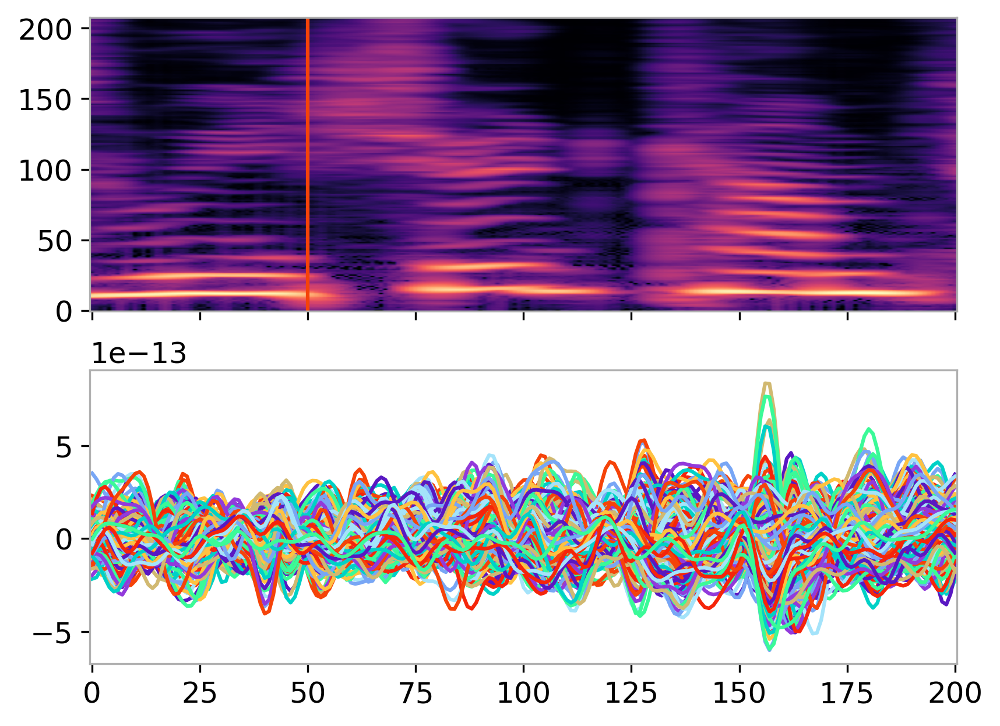

In [14]:
fig, (ax0, ax1) = plt.subplots(2, 1, sharex=True)
show_spec(audios[525], ax=ax0)
ax0.axvline(50)

ax1.plot(data[525].T)

plt.show()

In [13]:
assert data.shape[0] == audios.shape[0]
assert data.shape[2] == audios.shape[1]

In [14]:
N, n_channels, ts = data.shape

In [15]:
y = np.swapaxes(data[:, :n_channels, :], 1, 2)

In [16]:
y.shape  # (n_epochs, timesteps, channels)

# 201 timesteps at 250Hz

(30761, 201, 208)

In [17]:
X = audios

In [18]:
X.shape # (n_epochs, timesteps, mel freq bins)

(30761, 201, 208)

In [19]:
phonemes = meta.query("kind=='phoneme'")["s_phoneme"].values

In [29]:
last_story = meta.query("story=='lw1'").index.values
other = meta.query("story!='lw1'").index.values
X_test = X[last_story]
y_test = y[last_story]

In [1]:
X_train = X[other]
y_train = y[other]

NameError: name 'X' is not defined

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=phonemes
)

n_train, time_length, n_channels = y_train.shape
n_test = y_test.shape[0]

robust_scaler = RobustScaler(quantile_range=P.quantile_range)

y_train = robust_scaler.fit_transform(y_train.reshape(-1, n_channels))
y_test = robust_scaler.transform(y_test.reshape(-1, n_channels))

th = 20
y_train = np.clip(y_train, -th, th).reshape(n_train, time_length, n_channels)
y_test = np.clip(y_test, -th, th).reshape(n_test, time_length, n_channels)

In [ ]:
plt.hist(y_train.flatten(), bins=100)
plt.show()

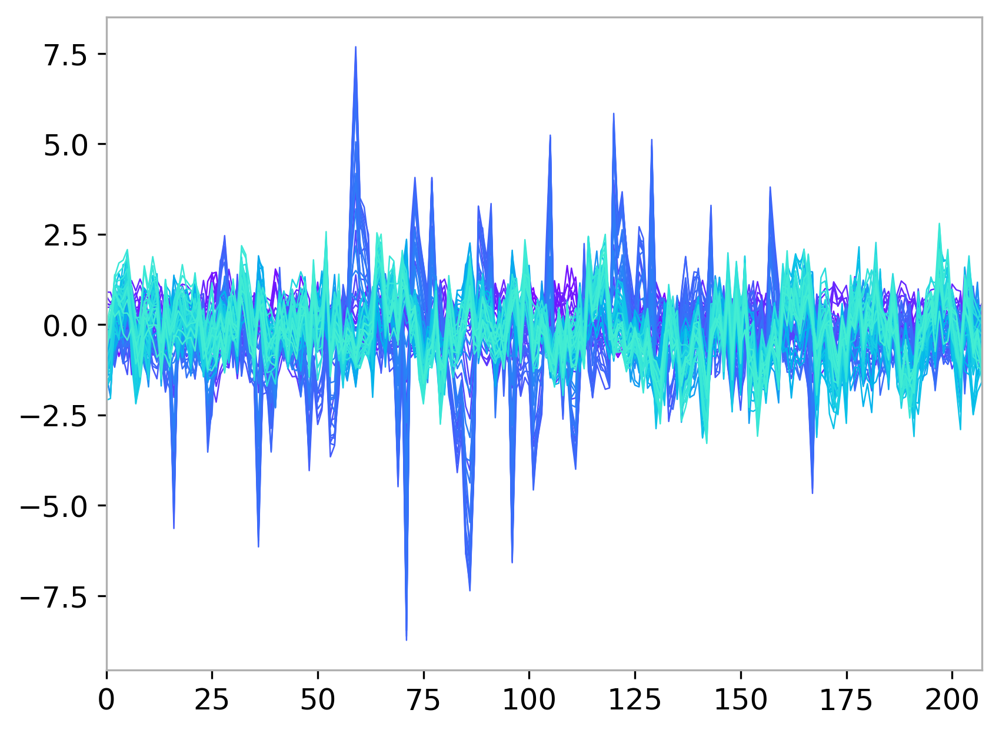

In [24]:
color = plt.cm.rainbow(np.linspace(0.0, 1.0, 208))
for i, x in enumerate(y_train[10]):
    plt.plot(x, c=color[i], lw=0.6)
plt.show()

In [22]:
labels = np.array([x[0, 0] for x in X_train])

In [ ]:
phoneme_info.head(60)

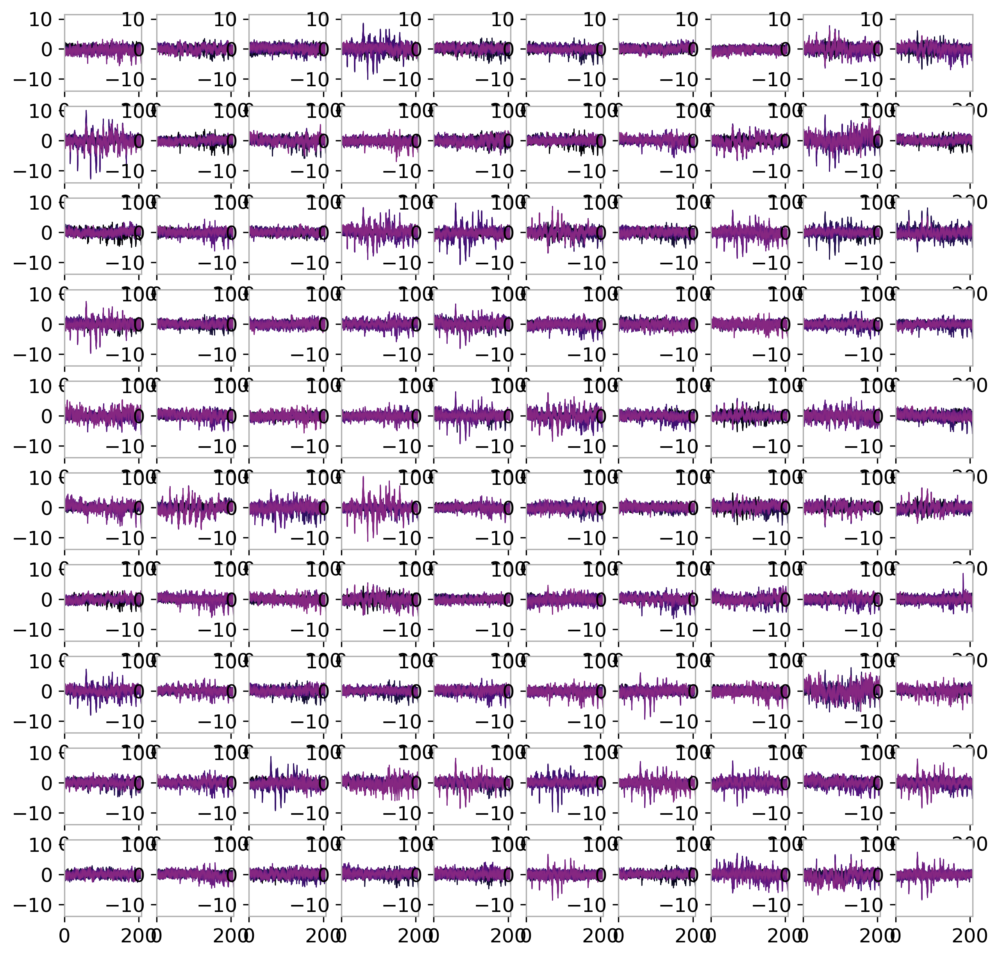

In [28]:
aa_X = y_train[np.where(labels == 0)]
max_plot = 100
color = plt.cm.magma(np.linspace(0.0, 1.0, 208))
fig = plt.figure(figsize=(10, 10))

for i, x in enumerate(aa_X):
    if i >= max_plot:
        break
    if i == 0:
        base_ax = fig.add_subplot(10, 10, i+1)
        for i, xx in enumerate(x):
            base_ax.plot(xx, c=color[i], lw=0.6)
    else:
        ax = fig.add_subplot(10, 10, i+1, sharey=base_ax)
        for i, xx in enumerate(x):
            ax.plot(xx, c=color[i], lw=0.6)
plt.show()

## With feedback

In [87]:
from reservoirpy import mat_gen
from reservoirpy.nodes import Reservoir, Ridge, ESN
import reservoirpy as rpy
from reservoirpy import mat_gen

W = mat_gen.uniform(high=0.5, low=-0.5)

rpy.verbosity(0)

reservoir = Reservoir(
    500, 
    lr=0.5, 
    sr=0.99, 
    input_scaling=1.0,
    fb_scaling=0.001,
    input_bias=True, 
    W=W,
    rc_connectivity=0.2,
    input_connectivity=0.2
)

readout = Ridge(ridge=1e-5)

# nothing happens without feedback (obviously)
reservoir <<= readout

esn = ESN(reservoir=reservoir, readout=readout, workers=-1)

In [88]:
from sklearn.preprocessing import RobustScaler, OneHotEncoder

oh_encoder = OneHotEncoder(sparse_output=False)

X_train_oh = oh_encoder.fit_transform(X_train.reshape(-1, 1)).reshape(
    n_train, time_length, -1
)

X_test_oh = oh_encoder.transform(X_test.reshape(-1, 1)).reshape(
    n_test, time_length, -1
)

warmup = round(
    np.abs(np.subtract(*P.epochs.baseline)) * ph_epochs.info["sfreq"]
)

X_train_oh[:, :warmup, :] = 0
X_test_oh[:, :warmup, :] = 0

In [89]:
esn = esn.fit(X_train_oh, y_train, warmup=warmup)

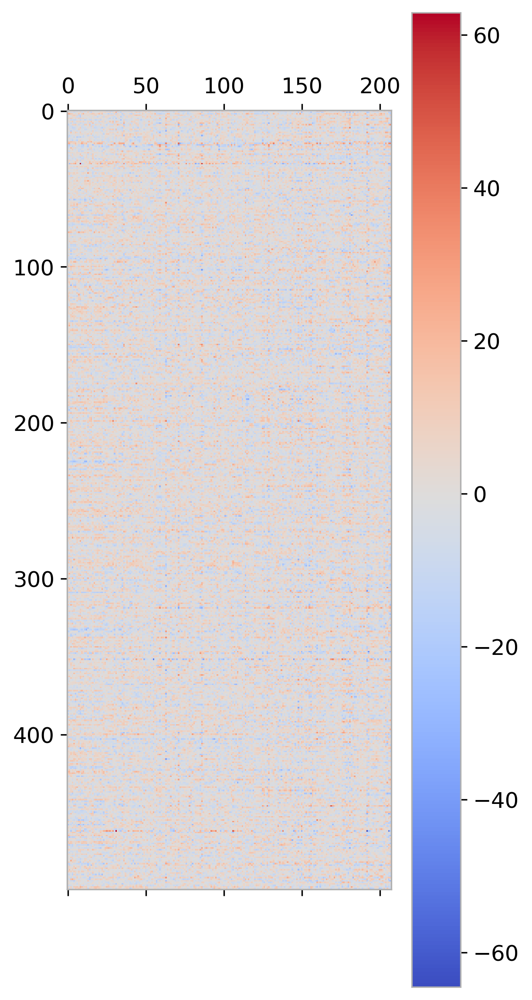

In [90]:
plt.matshow(readout.Wout, cmap="coolwarm")
plt.colorbar()

In [91]:
y_pred = esn.run(X_test_oh)

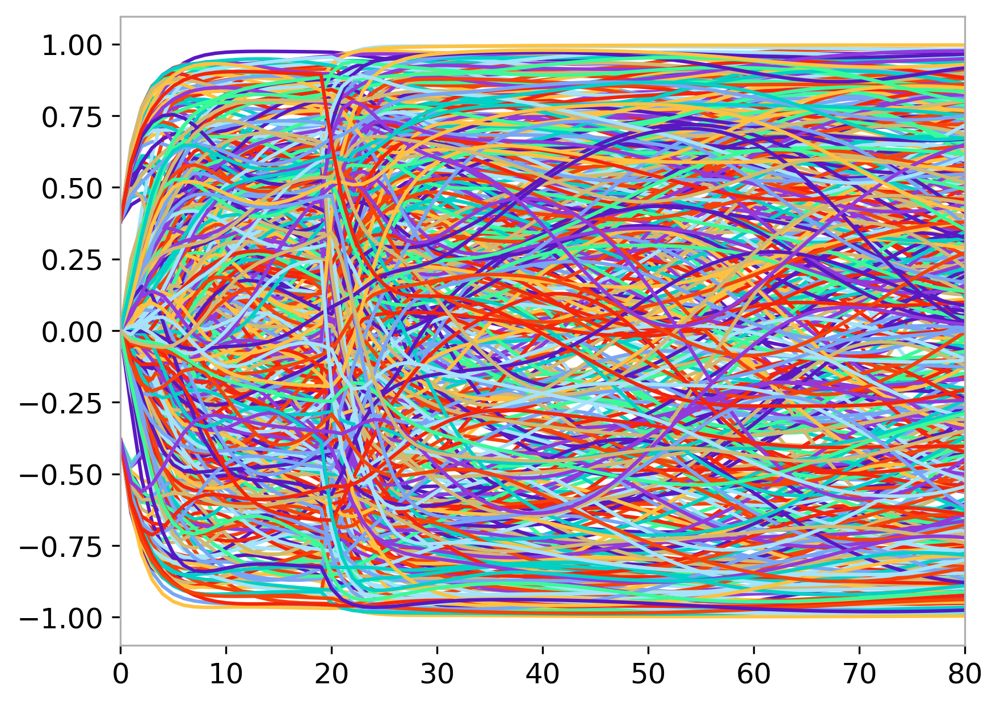

In [92]:
states = esn.run(X_test_oh[0], return_states=["reservoir"])
plt.plot(states["reservoir"])
plt.show()

In [93]:
pred_epochs = mne.EpochsArray(np.r_[y_pred].reshape(-1, 208, 81), ph_epochs.info)

Not setting metadata
3077 matching events found
No baseline correction applied
0 projection items activated


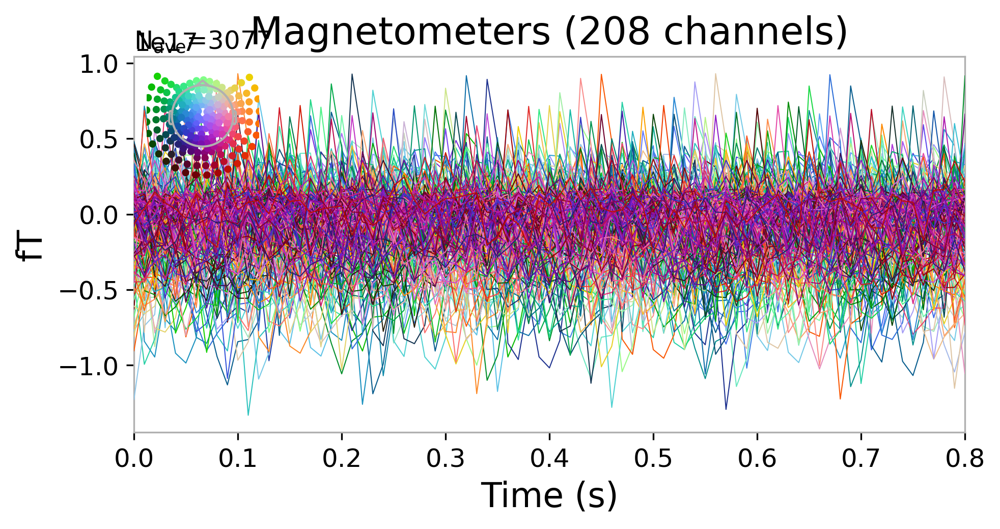

In [94]:
pred_epochs.average().plot()
plt.show()

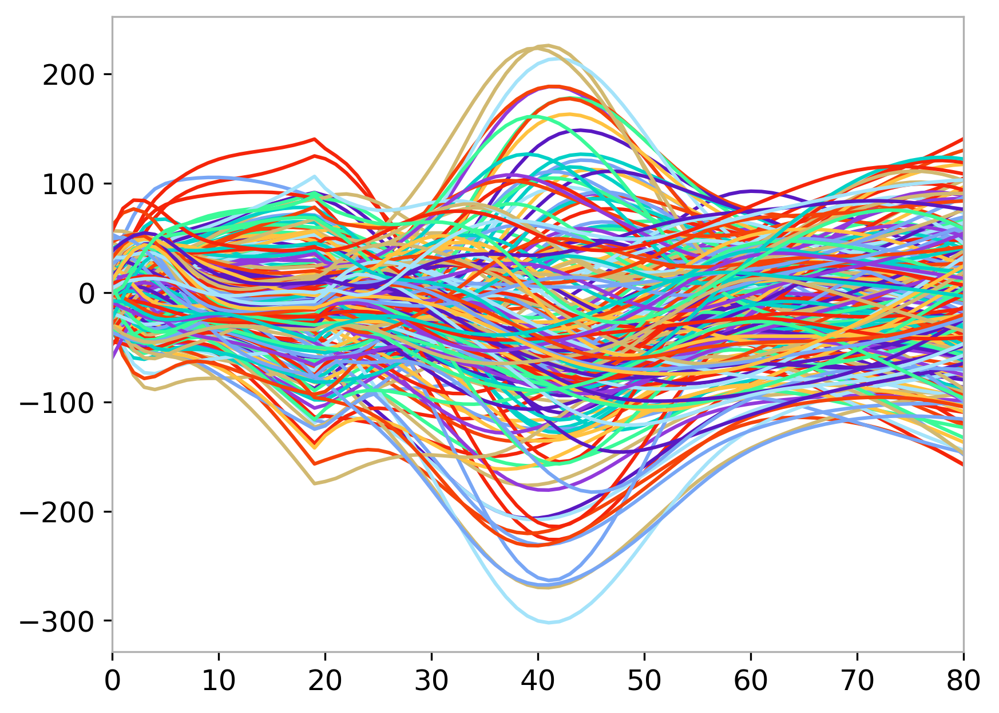

In [95]:
plt.plot(y_pred[1])
plt.show()

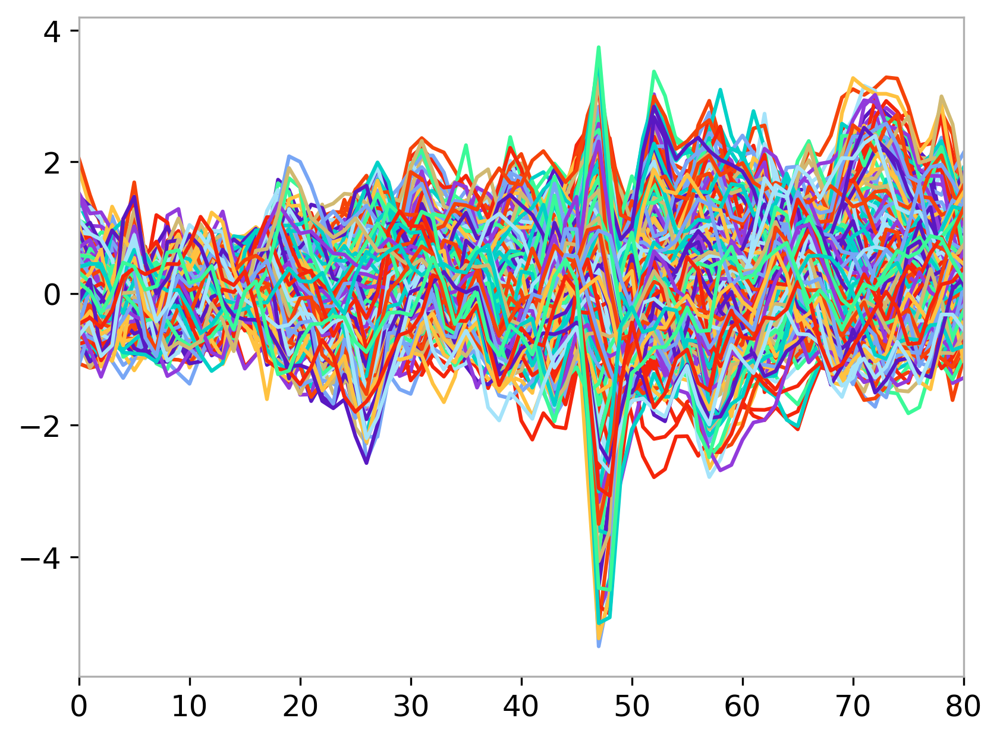

In [96]:
plt.plot(y_test[1])
plt.show()

In [97]:
from reservoirpy.observables import rsquare, rmse

print(rsquare(y_test, y_pred), rmse(y_test, y_pred))

-127.87256360558158 84.03796839859486


## Without feedback

In [98]:
from reservoirpy import mat_gen
from reservoirpy.nodes import Reservoir, Ridge, ESN
import reservoirpy as rpy
from reservoirpy import mat_gen

W = mat_gen.uniform(high=0.5, low=-0.5)

rpy.verbosity(0)

reservoir = Reservoir(
    500, 
    lr=0.5, 
    sr=0.99, 
    input_scaling=1.0,
    fb_scaling=0.001,
    input_bias=True, 
    W=W,
    rc_connectivity=0.2,
    input_connectivity=0.2
)

readout = Ridge(ridge=1e-5)

esn = ESN(reservoir=reservoir, readout=readout, workers=-1)

In [99]:
from sklearn.preprocessing import RobustScaler, OneHotEncoder

oh_encoder = OneHotEncoder(sparse_output=False)

X_train_oh = oh_encoder.fit_transform(X_train.reshape(-1, 1)).reshape(
    n_train, time_length, -1
)

X_test_oh = oh_encoder.transform(X_test.reshape(-1, 1)).reshape(
    n_test, time_length, -1
)

warmup = round(
    np.abs(np.subtract(*P.epochs.baseline)) * ph_epochs.info["sfreq"]
)

X_train_oh[:, :warmup, :] = 0
X_test_oh[:, :warmup, :] = 0

In [100]:
esn = esn.fit(X_train_oh, y_train, warmup=warmup)

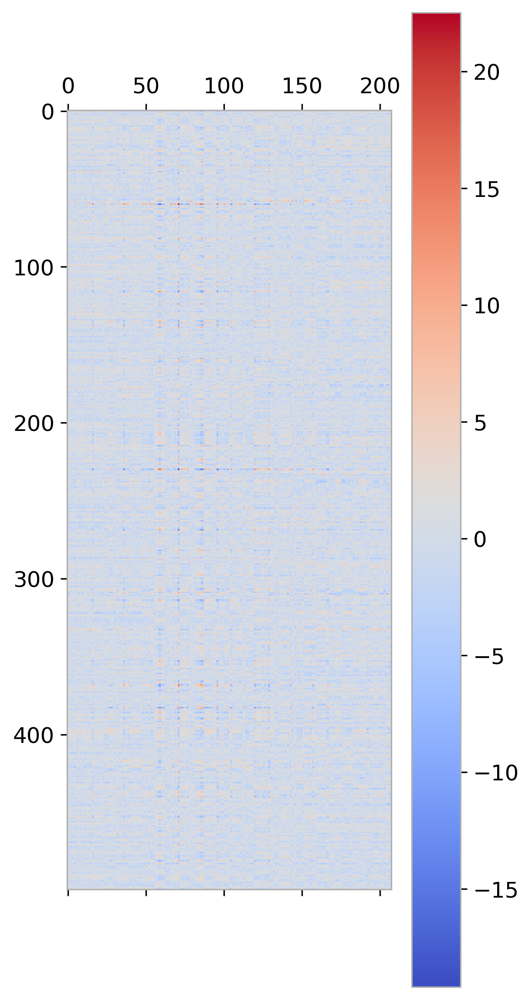

In [101]:
plt.matshow(readout.Wout, cmap="coolwarm")
plt.colorbar()

In [102]:
y_pred = esn.run(X_test_oh)

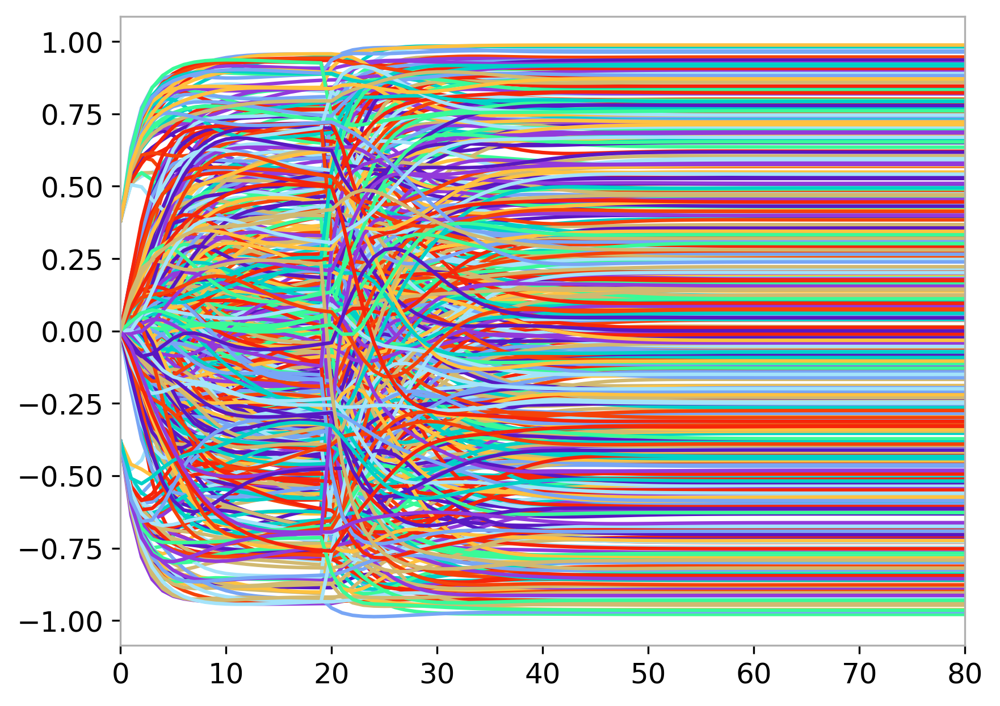

In [103]:
states = esn.run(X_test_oh[0], return_states=["reservoir"])
plt.plot(states["reservoir"])
plt.show()

In [104]:
pred_epochs = mne.EpochsArray(np.r_[y_pred].reshape(-1, 208, 81), ph_epochs.info)

Not setting metadata
3077 matching events found
No baseline correction applied
0 projection items activated


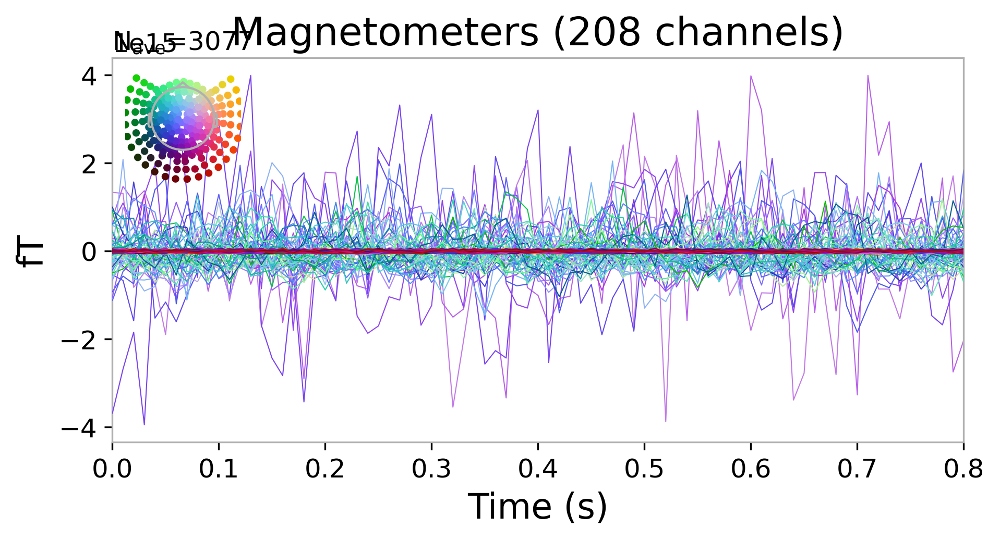

In [105]:
pred_epochs.average().plot()
plt.show()

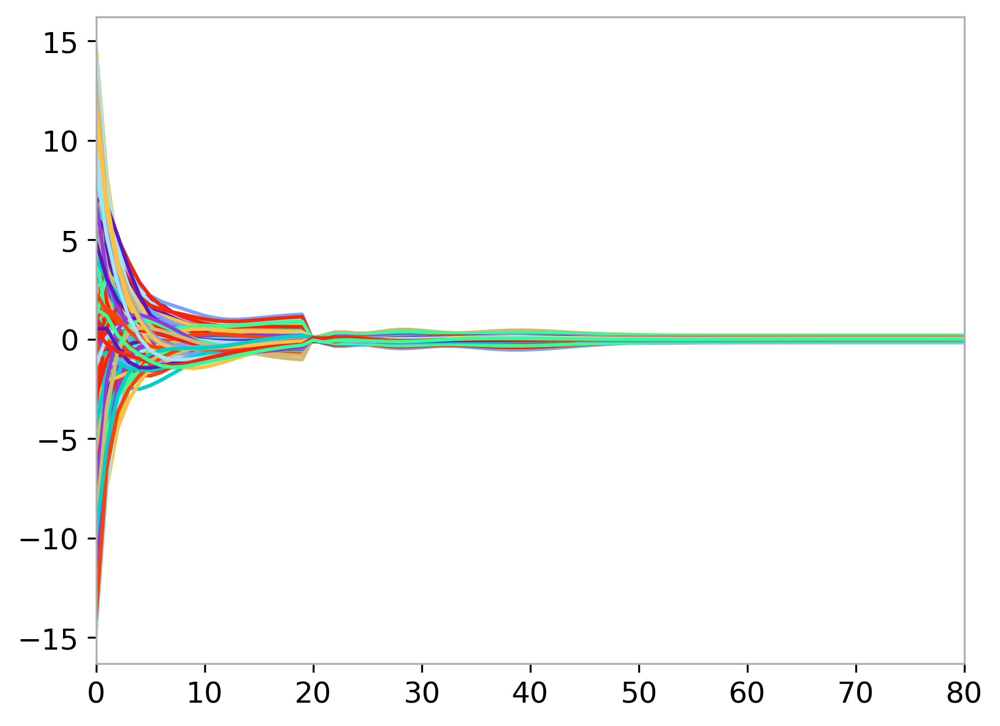

In [106]:
plt.plot(y_pred[1])
plt.show()

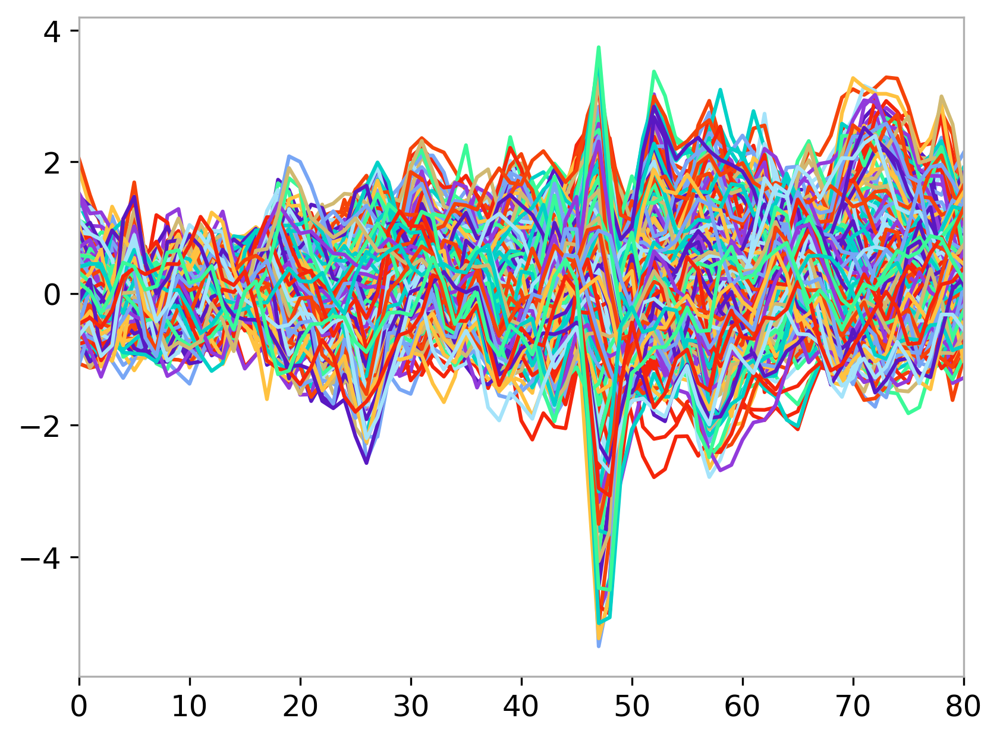

In [107]:
plt.plot(y_test[1])
plt.show()

In [108]:
from reservoirpy.observables import rsquare, rmse

print(rsquare(y_test, y_pred), rmse(y_test, y_pred))

-0.39651297609496483 1.1019346870270572
